# **Unsupervised Algorithms**  

This notebook demonstrates three fundamental machine learning algorithms:  

1. K-Means clustering 
2. Hierarchical clustering
3. DBSCAN

We'll use popular Python libraries like **scikit-learn**, **numpy**, and **matplotlib** to explore these algorithms.

In [1]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.datasets import make_blobs, make_moons
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

## Part 1: K-Means Clustering

In [4]:
# Generate synthetic data for K-Means
np.random.seed(42)
X, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=42)

In [5]:
X

array([[ -9.1139443 ,   6.81361629],
       [ -9.35457578,   7.09278959],
       [ -2.01567068,   8.28177994],
       [ -7.01023591,  -6.22084348],
       [-10.06120248,   6.71867113],
       [ -6.36503142,  -6.97607271],
       [  4.74378739,   2.20436011],
       [ -6.63186832,  -7.21834432],
       [ -2.79670217,   8.90289074],
       [  3.92509674,   2.36710185],
       [ -2.87022159,  10.12565304],
       [  4.85408813,   1.55742393],
       [ -2.38387947,   7.83848405],
       [ -3.35842007,   8.76189893],
       [ -9.2287133 ,   7.03124769],
       [ -2.93042948,   8.81768884],
       [ -9.81485322,   7.35237388],
       [  3.42479328,   2.08504227],
       [ -2.45095109,   9.59547312],
       [ -2.15708337,  10.3285595 ],
       [  5.33503618,   1.48076029],
       [ -2.60596905,   9.25671664],
       [ -6.29455535,  -6.96834402],
       [ -8.90572459,   7.19094116],
       [ -2.78724824,   8.73484828],
       [ -8.52044525,   8.18846409],
       [ -9.18439055,   7.77675765],
 

In [6]:
# Convert to a DataFrame
viz = pd.DataFrame(X, columns=['X', 'Y'])

# Create scatter plot
fig = px.scatter(viz, x='X', y='Y', title='Synthetic data')
fig.show()

In [7]:
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

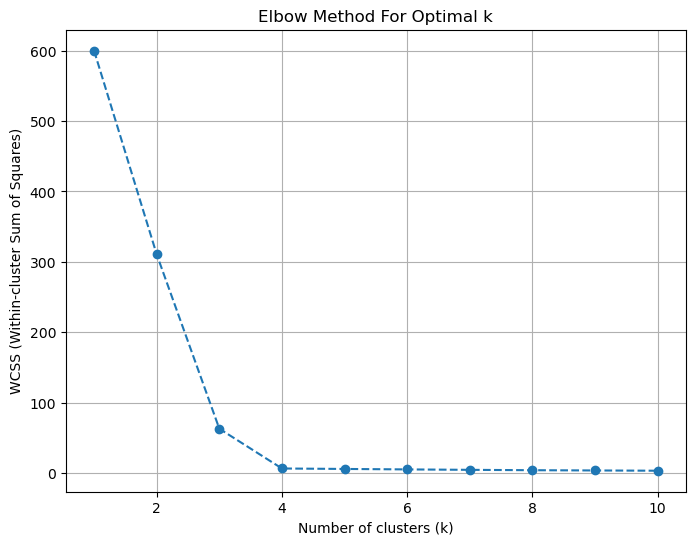

In [8]:
# Initialize an empty list to store the WCSS values
wcss = []

# Try different values of k (from 1 to 10)
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)  # inertia_ is the WCSS value

# Plot the WCSS vs the number of clusters (k)
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS (Within-cluster Sum of Squares)')
plt.grid(True)
plt.show()

In [9]:
# Perform K-Means clustering,
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)

/Users/kristinakhvatova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [10]:
kmeans.cluster_centers_

array([[ 1.55047856, -0.13507979],
       [-1.04162647,  0.71003314],
       [-0.66142128, -1.56752677],
       [ 0.15256919,  0.99257342]])

In [11]:
kmeans_labels

array([1, 1, 3, 2, 1, 2, 0, 2, 3, 0, 3, 0, 3, 3, 1, 3, 1, 0, 3, 3, 0, 3,
       2, 1, 3, 1, 1, 2, 2, 0, 3, 0, 1, 0, 1, 3, 1, 2, 1, 2, 0, 3, 1, 2,
       3, 3, 1, 0, 1, 0, 2, 1, 2, 3, 2, 0, 1, 0, 0, 3, 1, 0, 0, 1, 2, 2,
       2, 2, 2, 3, 2, 2, 1, 0, 3, 1, 2, 2, 3, 2, 3, 3, 1, 3, 2, 1, 1, 0,
       0, 0, 1, 3, 1, 3, 3, 1, 2, 3, 1, 1, 0, 0, 0, 3, 3, 3, 3, 3, 2, 1,
       0, 3, 3, 3, 3, 0, 1, 2, 1, 2, 2, 2, 3, 1, 2, 1, 1, 3, 1, 2, 0, 3,
       3, 3, 3, 0, 0, 1, 3, 2, 3, 0, 2, 3, 0, 0, 0, 0, 2, 3, 3, 1, 0, 2,
       3, 0, 2, 1, 1, 0, 3, 1, 2, 1, 0, 1, 2, 3, 3, 3, 3, 3, 2, 0, 0, 2,
       2, 0, 0, 2, 1, 3, 1, 0, 0, 1, 2, 3, 0, 0, 2, 2, 2, 1, 0, 2, 2, 0,
       0, 1, 3, 3, 2, 0, 3, 2, 2, 1, 2, 3, 3, 2, 2, 0, 1, 2, 1, 1, 3, 1,
       1, 2, 1, 2, 0, 0, 1, 1, 0, 0, 0, 1, 3, 2, 0, 2, 1, 0, 1, 1, 1, 2,
       2, 0, 1, 2, 2, 2, 1, 2, 1, 2, 1, 0, 2, 1, 0, 3, 1, 3, 0, 3, 1, 3,
       2, 0, 2, 0, 0, 3, 3, 2, 0, 0, 1, 1, 2, 3, 3, 0, 0, 0, 0, 2, 1, 0,
       2, 0, 0, 2, 3, 2, 0, 3, 1, 3, 0, 3, 1, 1], d

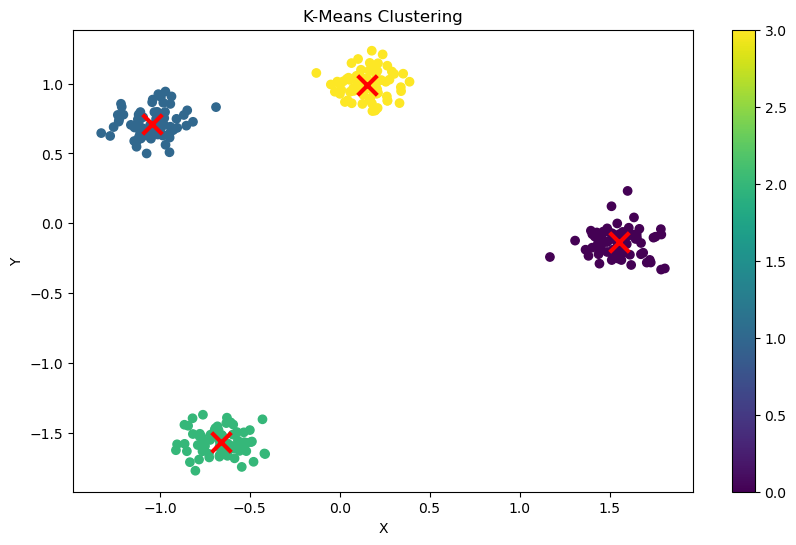

In [12]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=kmeans_labels, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', color='red', s=200, linewidths=3)
plt.title('K-Means Clustering')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(scatter)
plt.show()

## Part 2: Hierarchical Clustering

In [2]:
# Generate data for Hierarchical Clustering
np.random.seed(42)
X_hier, _ = make_moons(n_samples=300, noise=0.1, random_state=42)

In [3]:
X_hier

array([[ 6.82988224e-01, -3.45203344e-01],
       [ 2.04099043e+00, -1.31614674e-01],
       [-1.39751545e-01,  4.54390502e-01],
       [ 8.85747852e-01,  2.86341827e-01],
       [ 1.18245853e+00, -4.97710508e-01],
       [ 1.01920826e+00, -4.25465834e-01],
       [ 3.89361586e-01, -2.47117226e-01],
       [-5.60384576e-01,  7.12681100e-01],
       [ 9.01843523e-01,  5.39308727e-02],
       [ 2.06747907e-01,  6.20769309e-03],
       [ 1.32352331e+00, -2.89175832e-01],
       [ 3.83758712e-01,  8.51802379e-01],
       [ 9.69121626e-01, -4.85487343e-01],
       [ 6.69900924e-01,  9.19338590e-01],
       [ 1.23207593e-01,  1.35338991e-02],
       [ 1.01678336e+00, -5.57668763e-01],
       [ 2.00829930e+00,  3.16434346e-01],
       [ 7.21580319e-01, -3.72571143e-01],
       [-8.56042097e-01,  2.18135896e-02],
       [ 1.82685277e-01,  2.87798699e-01],
       [-5.04992232e-02,  1.01489642e+00],
       [-8.40751844e-01,  5.38150274e-01],
       [ 1.51040341e+00, -4.55110964e-01],
       [ 1.

In [4]:
# Convert to a DataFrame
viz = pd.DataFrame(X_hier, columns=['X', 'Y'])

# Create scatter plot
fig = px.scatter(viz, x='X', y='Y', title='Synthetic data')
fig.show()

In [5]:
# Scale the features
scaler = StandardScaler()
X_hier_scaled = scaler.fit_transform(X_hier)

In [17]:
# Compute the linkage matrix
linkage_matrix = linkage(X_hier_scaled, method='ward')

In [18]:
# Perform Hierarchical Clustering
hier_cluster = AgglomerativeClustering(n_clusters=2)
hier_labels = hier_cluster.fit_predict(X_hier_scaled)

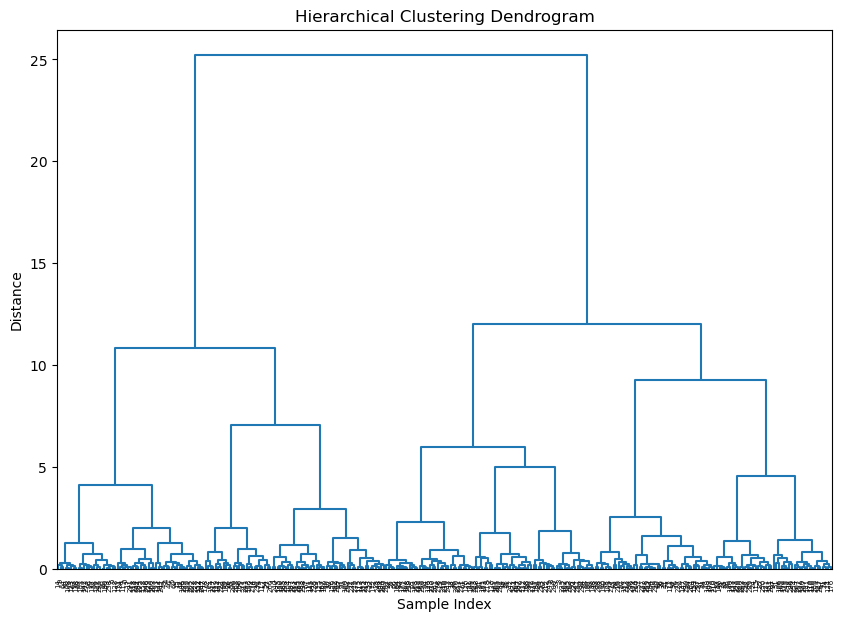

In [19]:
# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix, color_threshold=0)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

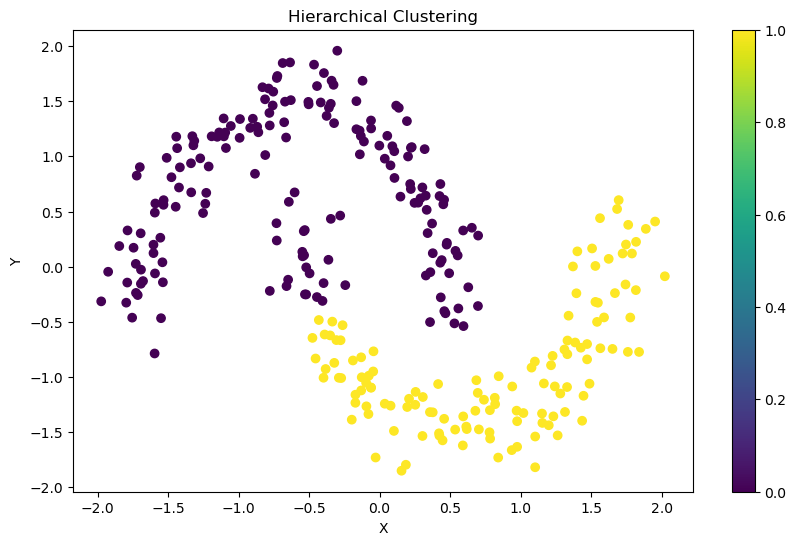

In [20]:
# Visualization
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_hier_scaled[:, 0], X_hier_scaled[:, 1], c=hier_labels, cmap='viridis')
plt.title('Hierarchical Clustering')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(scatter)
plt.show()

# Part 3: DBSCAN

In [21]:
X_hier, _ = make_moons(n_samples=300, noise=0.1, random_state=42)

In [22]:
X_hier

array([[ 6.82988224e-01, -3.45203344e-01],
       [ 2.04099043e+00, -1.31614674e-01],
       [-1.39751545e-01,  4.54390502e-01],
       [ 8.85747852e-01,  2.86341827e-01],
       [ 1.18245853e+00, -4.97710508e-01],
       [ 1.01920826e+00, -4.25465834e-01],
       [ 3.89361586e-01, -2.47117226e-01],
       [-5.60384576e-01,  7.12681100e-01],
       [ 9.01843523e-01,  5.39308727e-02],
       [ 2.06747907e-01,  6.20769309e-03],
       [ 1.32352331e+00, -2.89175832e-01],
       [ 3.83758712e-01,  8.51802379e-01],
       [ 9.69121626e-01, -4.85487343e-01],
       [ 6.69900924e-01,  9.19338590e-01],
       [ 1.23207593e-01,  1.35338991e-02],
       [ 1.01678336e+00, -5.57668763e-01],
       [ 2.00829930e+00,  3.16434346e-01],
       [ 7.21580319e-01, -3.72571143e-01],
       [-8.56042097e-01,  2.18135896e-02],
       [ 1.82685277e-01,  2.87798699e-01],
       [-5.04992232e-02,  1.01489642e+00],
       [-8.40751844e-01,  5.38150274e-01],
       [ 1.51040341e+00, -4.55110964e-01],
       [ 1.

In [25]:
viz = pd.DataFrame(X_hier, columns=['X', 'Y'])
viz.head()

,X,Y
0,0.682988,-0.345203
1,2.040990,-0.131615
2,-0.139752,0.454391
3,0.885748,0.286342
4,1.182459,-0.497711


In [26]:
fig = px.scatter(viz, x='X', y='Y', title="Viz per DBSCAN")
fig.show()

In [29]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_hier)

In [28]:
from sklearn.cluster import DBSCAN

In [32]:
dbscan = DBSCAN(eps=0.3, min_samples=5)
labels = dbscan.fit_predict(X_scaled)

In [33]:
labels

array([ 0,  0,  0,  1,  0,  0,  0,  1,  1,  0,  0,  1,  0,  1,  0,  0,  0,
        0,  1,  0,  1,  1,  0,  0,  1,  1,  0,  0,  0,  0,  1,  0,  1,  1,
        0,  1,  1,  1,  1,  1,  1,  1,  0,  1,  1,  1,  0,  0,  1,  0,  0,
        1,  0,  1,  0,  0,  1,  1,  0,  1,  0,  1,  1,  0,  0,  1,  1,  0,
        1,  0,  1,  1,  0,  0,  1,  0,  1,  1,  1,  0,  0,  0,  1,  1,  1,
        1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  0, -1,  0,  1,  0,  1,
        1,  0,  0,  0,  1,  1,  0,  1,  1,  0,  1,  0,  0,  1,  1,  0,  0,
        0,  1,  0,  0,  0,  1,  0,  1,  1,  0,  0,  1,  1,  0,  1,  0,  0,
        0,  0,  0,  1,  1,  1,  0,  1, -1,  0,  1,  1,  1,  1,  0,  1,  0,
        0,  0,  0,  0,  1,  0,  1,  0,  0,  1,  1,  1,  1,  0,  0,  0,  1,
        1,  0,  0,  1,  1,  0,  1,  1,  0,  1,  0,  1,  0,  0,  1,  0,  0,
        0,  1,  1,  1,  0,  0,  0,  0,  1,  0,  0,  1,  0,  1,  1,  1,  0,
        0,  0,  0,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  0,  0,  1,  1,
        0,  0,  0,  1,  0

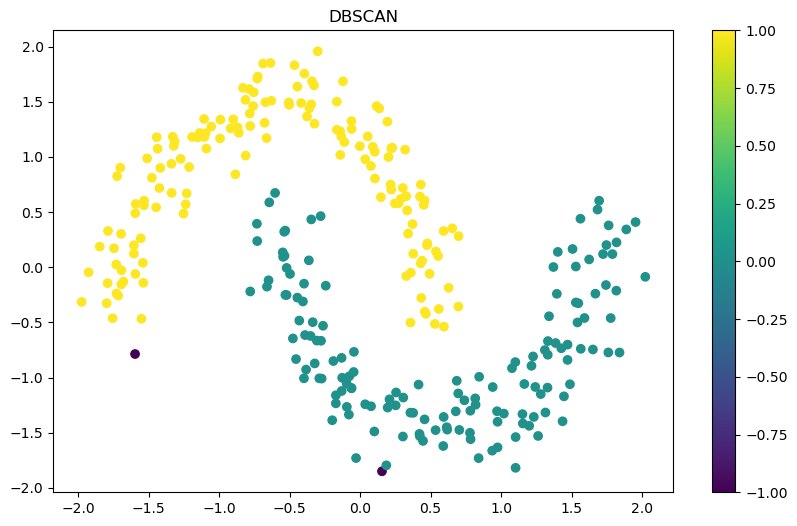

In [36]:
plt.figure(figsize=(10,6))
scatter = plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels, cmap='viridis')
plt.title("DBSCAN")
plt.colorbar(scatter)
plt.show()